### To be run in colab

[![OpenInColab](https://colab.research.google.com/assets/colab-badge.svg)](
    https://colab.research.google.com/github/AustinHouston/MLSTEM2025/blob/main/Day2/8_positive_CBED.ipynb)

Run the cell below, then restart the runtime

In [ ]:


!pip install ipympl


### Load in required libraries

In [1]:
import os
import re
import sys

import csv
import pandas as pd

import numpy as np
from numpy.linalg import lstsq

from scipy.ndimage import gaussian_filter, binary_fill_holes, binary_dilation, binary_closing, distance_transform_edt, center_of_mass, zoom
from skimage.measure import label, regionprops
from skimage.feature import blob_log
from skimage.filters import gaussian, sobel
from skimage.morphology import disk, remove_small_objects

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

from collections import Counter

# clone the github for the NN and vk4 reader files
repo_url = 'https://github.com/AustinHouston/CarbonFiberComposites.git'
!git clone {repo_url}

from neural_network_stuff import *
from vk4_reader import vk4extract

# plotting
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from mpl_toolkits.mplot3d import Axes3D
if 'google.colab' in sys.modules:
    %matplotlib widget
    from google.colab import output
    output.enable_custom_widget_manager()

### Load in data

In [ ]:
from google.colab import drive
if 'google.colab' in sys.modules:
    drive.mount("/content/drive")

In [2]:
# .vk4 file you want to read, ex:
# read_filename = "/Users/austin/Desktop/Susan/Susan.vk4"
read_filename = "/Users/austin/Desktop/Susan/Susan.vk4"


# path of the folder where you want to save the results
# save_path = "/Users/austin/Desktop/Susan/Sample001/"
save_path = "/Users/austin/Desktop/Susan/Sample001/"

In [3]:
with open(read_filename, 'rb') as in_file:
    offsets = vk4extract.extract_offsets(in_file)
    measurements = vk4extract.extract_measurement_conditions(offsets, in_file)

    rgb_dict = vk4extract.extract_color_data(offsets, 'peak', in_file)
    light_dict = vk4extract.extract_img_data(offsets, 'light', in_file)
    height_dict = vk4extract.extract_img_data(offsets, 'height', in_file)

rgb_data = rgb_dict['data']
light_data = light_dict['data']
height_data = height_dict['data']

x_shape = light_dict['width']
y_shape = light_dict['height']

# scale
x_scale = measurements['x_length_per_pixel'] * 1e-6 # um
y_scale = measurements['y_length_per_pixel'] * 1e-6 # um
z_scale = measurements['z_length_per_digit'] * 1e-6 # um

# save these for later
np.savez(save_path + 'scales.npz', x_scale=x_scale, y_scale=y_scale, z_scale=z_scale)

# reshape
rgb_array = np.reshape(rgb_data, (y_shape, x_shape, 3))
light_array = np.reshape(light_data, (y_shape, x_shape))
height_array = np.reshape(height_data, (y_shape, x_shape)) * z_scale

# normalize
light_array = light_array - np.min(light_array)
light_array = light_array / np.max(light_array)


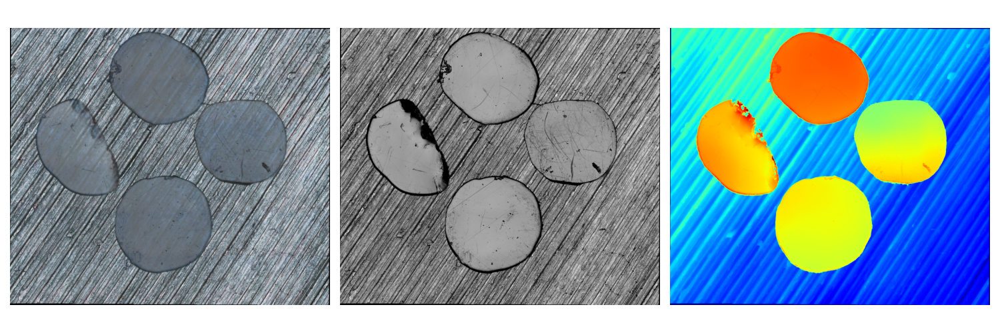

KeyError: 'buttons'

KeyError: 'buttons'

KeyError: 'buttons'

KeyError: 'buttons'

KeyError: 'buttons'

In [4]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True)

ax[0].imshow(rgb_array)
ax[1].imshow(light_array, cmap = 'gray')
ax[2].imshow(height_array, cmap = 'jet')

for a in ax:
    a.axis('off')
fig.tight_layout()  


### Make a mask based on thresholding the height map

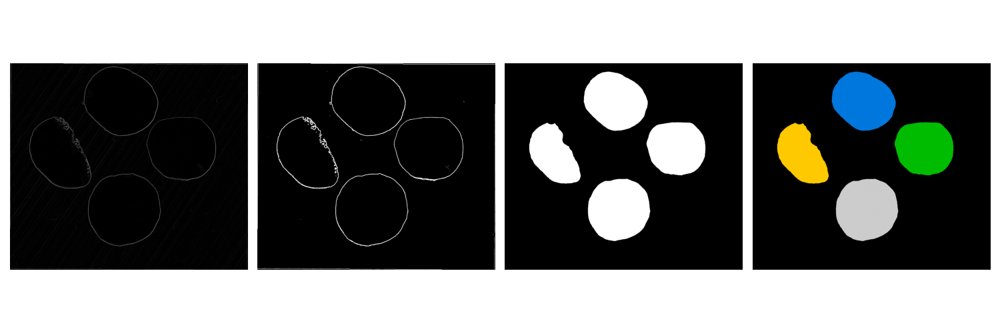

In [5]:
smoothed = gaussian_filter(height_array, sigma=2)
edges = sobel(smoothed)
edges = edges - np.min(edges)
edges = edges / np.max(edges)

threshold = 0.1 # between 0 and 1
binary_edges = edges > threshold

# Fill holes and clean small objects
connected_edges = binary_closing(binary_edges, structure=disk(5))
filled_edges = binary_fill_holes(connected_edges)
cleaned_mask = remove_small_objects(filled_edges, min_size=500)
# erode regions
distance = distance_transform_edt(cleaned_mask)
erosion_depth = 100  # Number of pixels to erode
eroded_mask = distance > erosion_depth

labeled_mask = label(eroded_mask)

fig, ax = plt.subplots(1,4, figsize=(15,5), sharex=True, sharey=True)
ax[0].imshow(edges, cmap='gray')
ax[1].imshow(binary_edges, cmap='gray')
ax[2].imshow(eroded_mask, cmap='gray')
ax[3].imshow(labeled_mask, cmap='nipy_spectral')
for a in ax:
    a.axis('off')
fig.tight_layout()

Text(0.5, 1.0, 'Flattened Height Array')

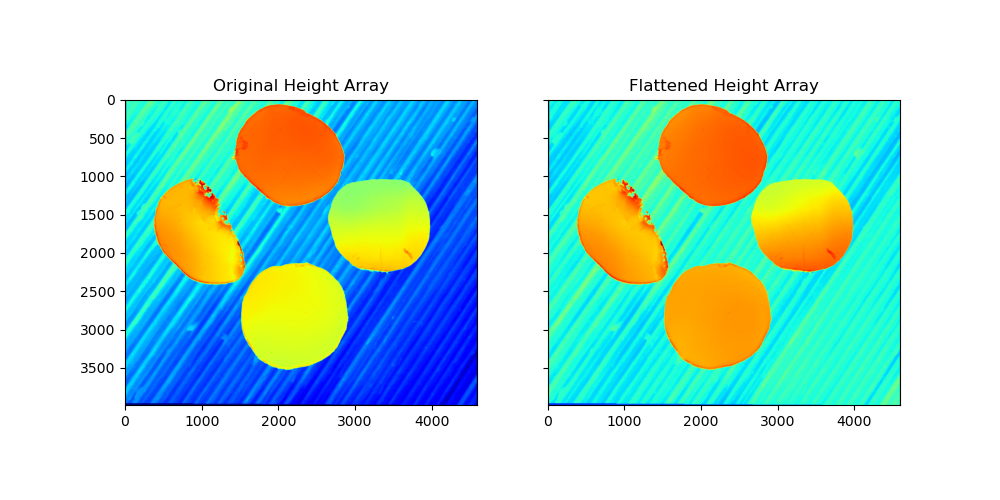

In [6]:
#let's fit a plane to the background of the height array and subtract it
background_mask = 1 - cleaned_mask.astype(np.uint8)
height_background = np.ma.masked_where(background_mask == 0, height_array)

# Fit a plane to the background
x, y = np.meshgrid(np.arange(height_array.shape[1]), np.arange(height_array.shape[0]))
x = x[background_mask == 1]
y = y[background_mask == 1]
z = height_array[background_mask == 1]
A = np.c_[x, y, np.ones_like(x)]
coeffs, _, _, _ = lstsq(A, z, rcond=None)  # Solve for [a, b, c]
plane = coeffs[0] * np.arange(height_array.shape[1])[None, :] + \
        coeffs[1] * np.arange(height_array.shape[0])[:, None] + \
        coeffs[2]
flattened_height = height_array - plane

fig, ax = plt.subplots(1,2, figsize=(10,5), sharex=True, sharey=True)
ax[0].imshow(height_array, cmap='jet')
ax[0].set_title('Original Height Array')
ax[1].imshow(flattened_height, cmap='jet')
ax[1].set_title('Flattened Height Array')


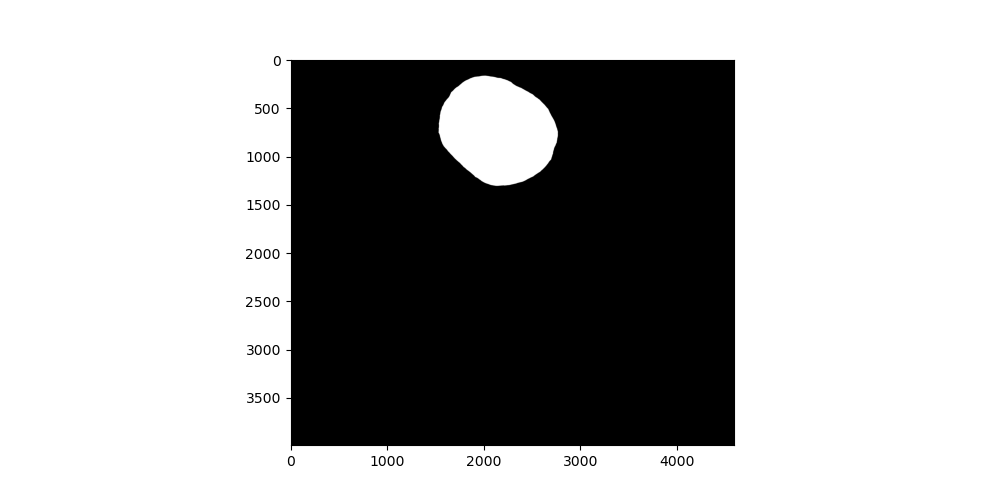

In [7]:
# ------------------------------------------------------------------------------------------------------------------------------------------------
# INPUT:
labeler = 1
# ------------------------------------------------------------------------------------------------------------------------------------------------

region_of_interest = np.where(labeled_mask == labeler, 1, 0)

fig, ax = plt.subplots(1,1, figsize=(10,5), sharex=True, sharey=True)
ax.imshow(region_of_interest, cmap='gray')

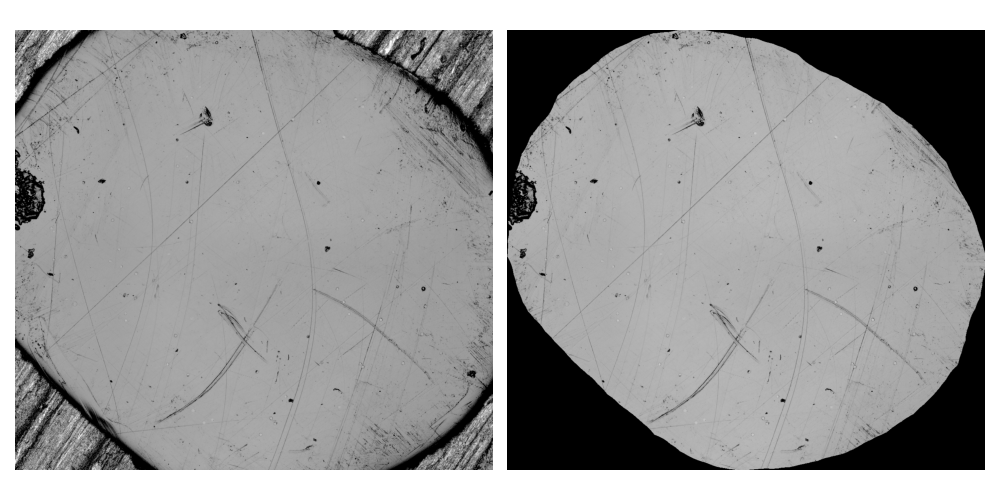

In [8]:
selected_area = light_array * region_of_interest
roi_bounding_box = [np.min(np.where(region_of_interest)[0]), np.max(np.where(region_of_interest)[0]), np.min(np.where(region_of_interest)[1]), np.max(np.where(region_of_interest)[1])]
roi = selected_area[roi_bounding_box[0]:roi_bounding_box[1], roi_bounding_box[2]:roi_bounding_box[3]]
roi_rgb = rgb_array[roi_bounding_box[0]:roi_bounding_box[1], roi_bounding_box[2]:roi_bounding_box[3]]
cropped_image = light_array[roi_bounding_box[0]:roi_bounding_box[1], roi_bounding_box[2]:roi_bounding_box[3]]

fig, ax = plt.subplots(1,2, figsize=(10,5), sharex=True, sharey=True)
ax[0].imshow(cropped_image, cmap = 'gray')
ax[1].imshow(roi, cmap = 'gray')
for a in ax:
    a.axis('off')
fig.tight_layout()

In [9]:
# Check if a GPU is available and if not, use a CPU
if hasattr(torch.backends, 'mps') and torch.backends.mps.is_available():
    device = torch.device('mps') # backend for Apple silicon GPUs
elif torch.cuda.is_available():
    device = 'cuda'
else:
    device = 'cpu'
print(device)

# Load the model weights
model = Unet(input_channels=1, num_classes=2,
    num_filters=[16,32,64], dropout = 0.1).to(device)
model.load_state_dict(torch.load('unet_model.pth'))

mps


<All keys matched successfully>

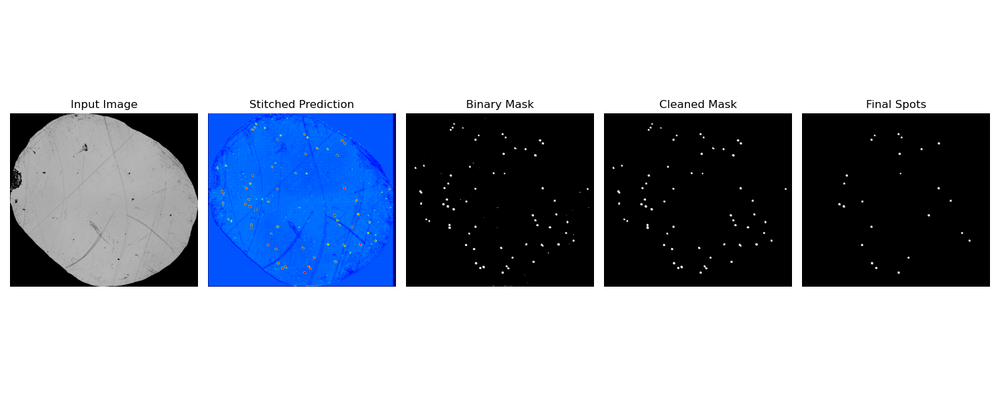

In [10]:
region_of_interest = np.where(labeled_mask == labeler, 1, 0)
selected_area = light_array * region_of_interest
roi_bounding_box = [np.min(np.where(region_of_interest)[0]), np.max(np.where(region_of_interest)[0]), np.min(np.where(region_of_interest)[1]), np.max(np.where(region_of_interest)[1])]
roi = selected_area[roi_bounding_box[0]:roi_bounding_box[1], roi_bounding_box[2]:roi_bounding_box[3]]

# selected_area_height = flattened_height * region_of_interest
# roi_height = selected_area_height[roi_bounding_box[0]:roi_bounding_box[1], roi_bounding_box[2]:roi_bounding_box[3]]
roi_height = flattened_height[roi_bounding_box[0]:roi_bounding_box[1], roi_bounding_box[2]:roi_bounding_box[3]]

full_prediction = predict_full_image(model, device, roi, patch_size=40, stride=20, edge_crop=3)

threshold = np.mean(full_prediction) * 2
binary_mask = full_prediction > threshold

connected_spots = binary_closing(binary_mask, structure=disk(3))
filled_spots = binary_fill_holes(connected_spots)
cleaned_mask = remove_small_objects(filled_spots, min_size=50)
labeled_spots = label(cleaned_mask)
regions = regionprops(labeled_spots)
circular_regions = []
for region in regions:
    if region.eccentricity < 0.5:  # Adjust this threshold as needed
        circular_regions.append(region.label)
spots = np.isin(labeled_spots, circular_regions)

# Visualize
fig, ax = plt.subplots(1, 5, figsize=(15, 6), sharex=True, sharey=True)
ax[0].imshow(roi, cmap='gray')
ax[0].set_title('Input Image')
ax[1].imshow(full_prediction, cmap='jet')
ax[1].set_title('Stitched Prediction')
ax[2].imshow(binary_mask, cmap='gray')
ax[2].set_title('Binary Mask')
ax[3].imshow(cleaned_mask, cmap='gray')
ax[3].set_title('Cleaned Mask')
ax[4].imshow(spots, cmap='gray')
ax[4].set_title('Final Spots')

for a in ax:
    a.axis('off')
fig.tight_layout()
plt.show()


In [11]:
unique_spots = label(spots)
labels = np.unique(unique_spots)

crop_size = 10
crops = []
heights = []
positions_pix = []
for idx in labels[1:]:  # Skip label 0 (background)
    spot = np.where(unique_spots == idx, 1, 0)
    com = center_of_mass(spot)
    com = (int(com[0]), int(com[1]))
    positions_pix.append(com)

    x_min = max(com[0] - crop_size, 0)
    x_max = min(com[0] + crop_size, roi.shape[0])
    y_min = max(com[1] - crop_size, 0)
    y_max = min(com[1] + crop_size, roi.shape[1])
    
    image_crop = roi[x_min:x_max, y_min:y_max].copy()
    image_crop -= np.min(image_crop)
    image_crop /= np.max(image_crop)
    crops.append(image_crop)

    height = roi_height[com[0], com[1]]
    heights.append(height)

crops = np.array(crops)
heights = np.array(heights)
positions = np.array(positions_pix)


pos_in_crop = []
radii = []
for crop in crops:
    smoothed = gaussian(crop, sigma=0.1)
    
    # Detect blobs with high resolution and sub-pixel accuracy
    blobs = blob_log(smoothed, min_sigma=1, max_sigma=5, num_sigma=200, threshold=0.01)

    if len(blobs) > 0:
        blobs[:, 2] = blobs[:, 2] * 2 * np.sqrt(2)  # Convert sigma to diameter

        # Keep blobs only within the middle half of the crop
        h, w = crop.shape
        valid_blobs = [blob for blob in blobs if (h * 0.25 < blob[0] < h * 0.75) and (w * 0.25 < blob[1] < w * 0.75)]
        if len(valid_blobs) > 0:
            center = np.array(crop.shape) / 2
            distances = np.linalg.norm(np.array(valid_blobs)[:, :2] - center, axis=1)
            closest_blob = valid_blobs[np.argmin(distances)]
            radii.append(closest_blob[2])  # Append the diameter

            y, x, r = closest_blob
            pos_in_crop.append((y, x))
            # fig, ax = plt.subplots()
            # ax.imshow(smoothed, cmap='gray')
            # 
            # circle = plt.Circle((x, y), r, color='red', fill=False, linewidth=2)
            # ax.add_patch(circle)
            # ax.set_title('Detected Bright Blob (LoG)')
            # ax.axis('off')
            # plt.show()
        else:
            radii.append(None)  # No valid blobs found in the middle half
            pos_in_crop.append((-1,-1))
    else:
        radii.append(None)  # No blobs detected at all
        pos_in_crop.append((-1,-1))


In [12]:
new_crop_size = 10
new_crops = []
new_positions_pix = []

for original_pos, offset in zip(positions_pix, pos_in_crop):
    if offset == (-1, -1):  # Skip if no valid blob was found
        new_crops.append(np.zeros((2 * new_crop_size, 2 * new_crop_size)))  # Placeholder crop
        new_positions_pix.append((-1, -1))
        continue

    # Calculate new center position based on the offset within the original crop
    new_com = (original_pos[0] + int(offset[0] - crop_size), original_pos[1] + int(offset[1] - crop_size))

    x_min = max(new_com[0] - new_crop_size, 0)
    x_max = min(new_com[0] + new_crop_size, roi.shape[0])
    y_min = max(new_com[1] - new_crop_size, 0)
    y_max = min(new_com[1] + new_crop_size, roi.shape[1])

    new_image_crop = roi[x_min:x_max, y_min:y_max].copy()
    new_image_crop -= np.min(new_image_crop)
    new_image_crop /= np.max(new_image_crop)
    new_crops.append(new_image_crop)

    new_positions_pix.append(new_com)

new_crops = np.array(new_crops)
new_positions_pix = np.array(new_positions_pix)
radii = np.array(radii)
heights = np.array(heights)

valid_indices = [i for i, pos in enumerate(new_positions_pix) if pos[0] != -1 and pos[1] != -1]
filtered_crops = new_crops[valid_indices]
filtered_positions_pix = new_positions_pix[valid_indices]
filtered_radii = radii[valid_indices]
filtered_heights = heights[valid_indices]


In [13]:
crops = []
for crop in filtered_crops:
    crop = crop - np.min(crop)
    crop = crop / np.max(crop)  # normalize
    crop -= np.mean(crop)  # center
    zoom_factor = 80 / 20
    crop = zoom(crop, zoom_factor, order=3)
    crops.append(crop)
crops = np.array(crops)


In [14]:
def radial_sum_profile(crop):
    """Compute the radial sum profile of an image."""
    h, w = crop.shape
    y, x = np.indices((h, w))  # Generate coordinate grids
    center = (h // 2, w // 2)  # Assume center is (40,40)
    
    r = np.sqrt((x - center[1])**2 + (y - center[0])**2)  # Compute radial distances
    r = r.astype(np.int32)  # Convert to integer bins

    max_r = int(np.max(r))  # Max radius in the image
    radial_sum = np.zeros(max_r + 1)  # Store sum in each radius bin
    
    # Sum up pixel values in each radial bin
    for radius in range(max_r + 1):
        radial_sum[radius] = crop[r == radius].sum()

    return radial_sum

/var/folders/1h/36qxtl8567zdjv8nzdn4fzrr0000gn/T/ipykernel_2307/1296416444.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,2, figsize=(10,5))


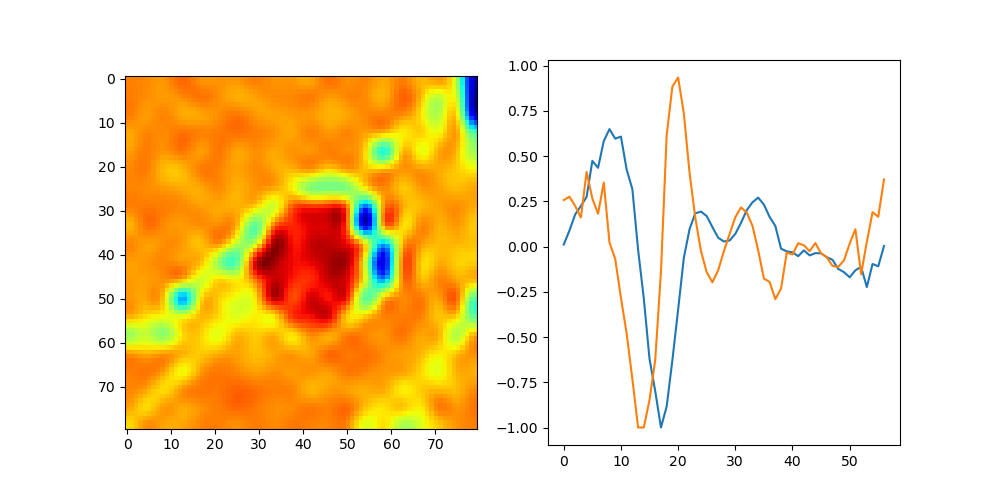

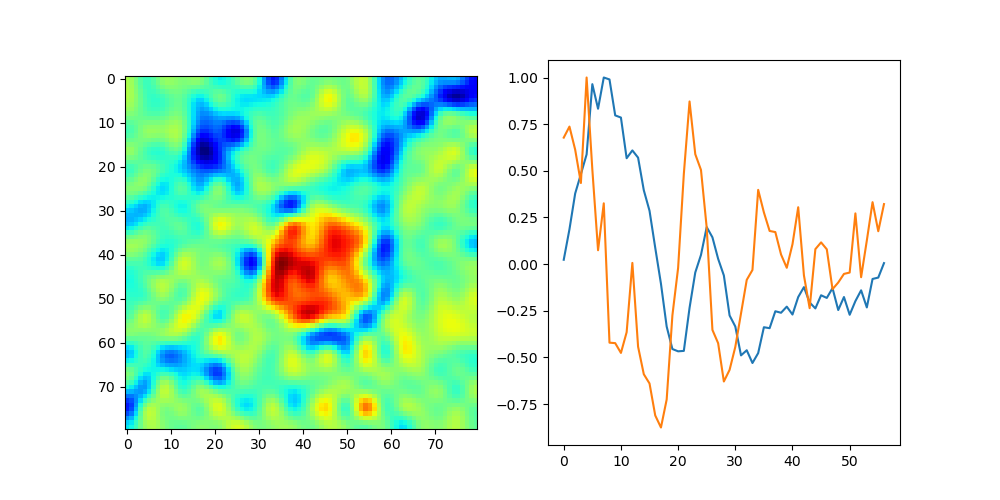

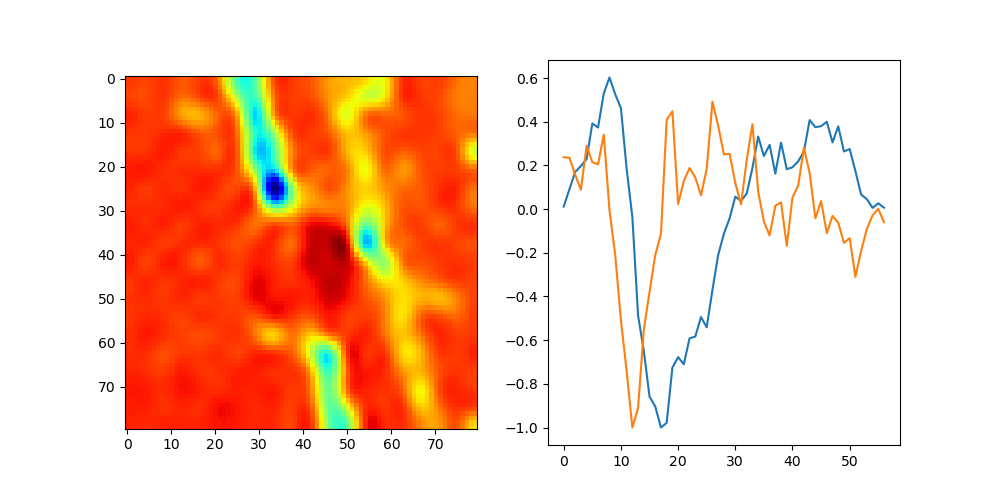

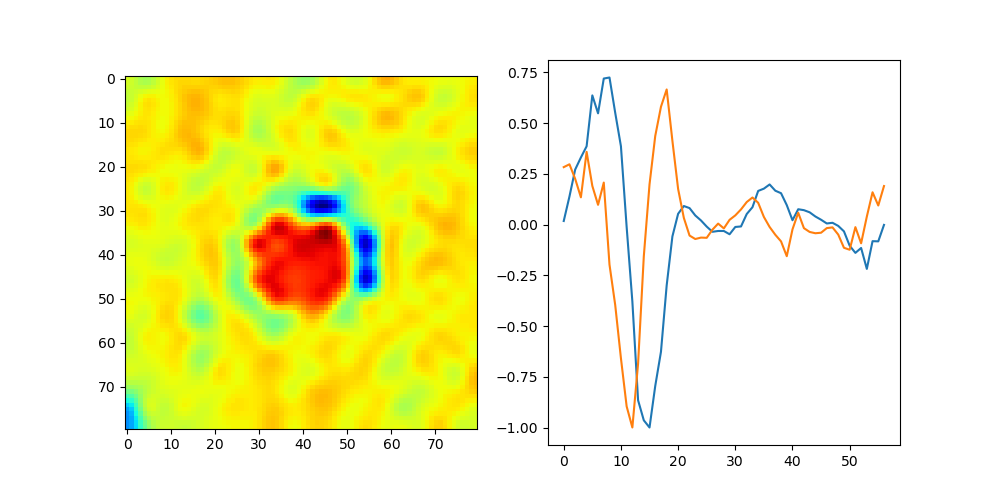

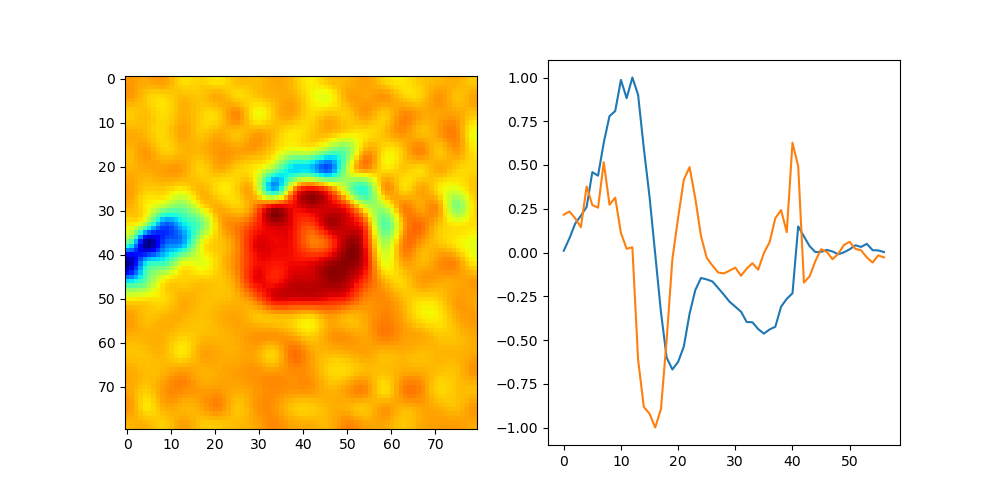

...

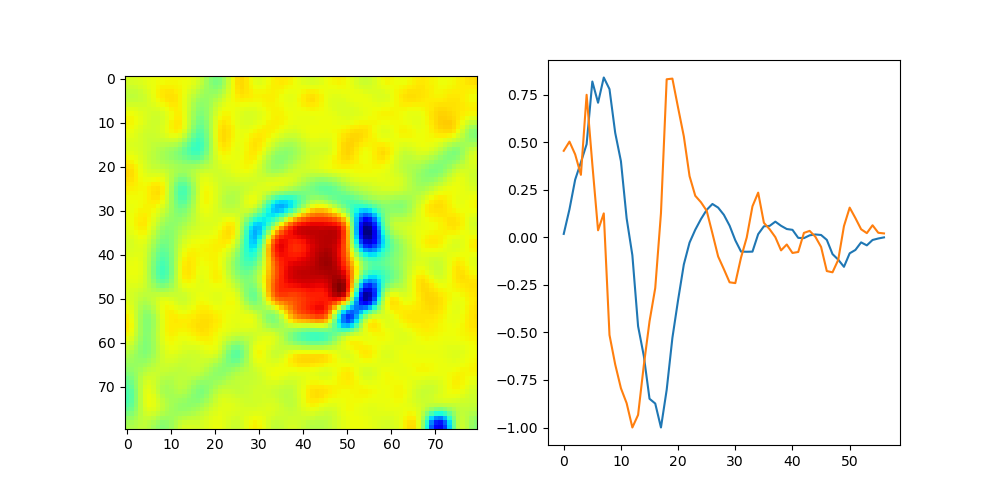

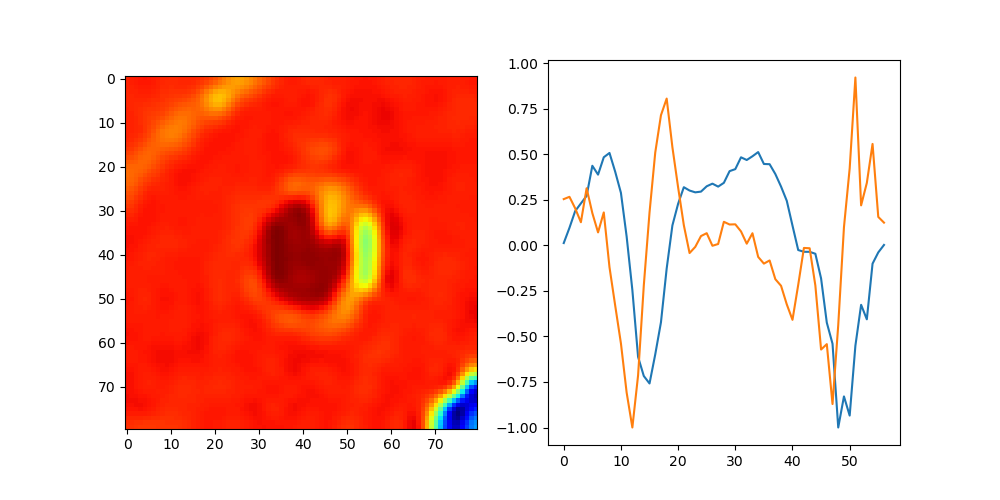

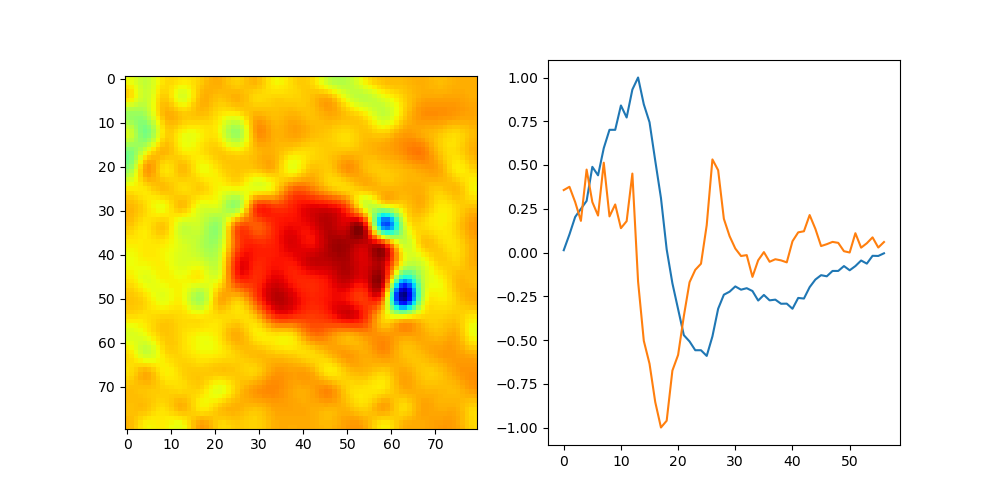

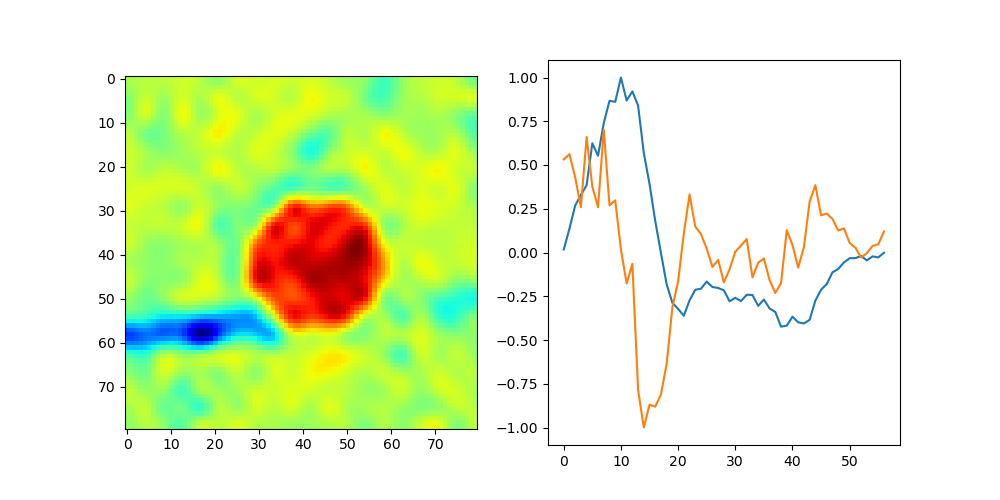

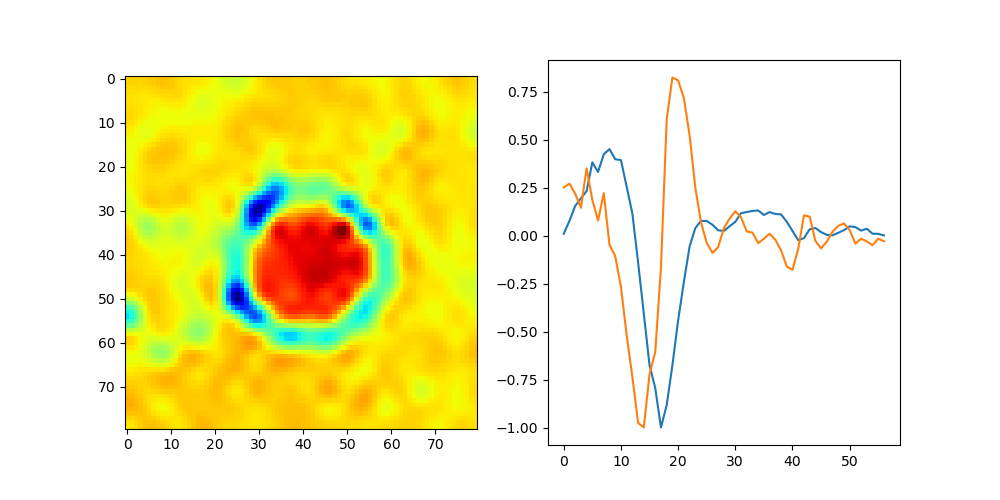

In [15]:
min_dervs = []
for crop in crops:
    radial_profile = radial_sum_profile(crop)
    radial_profile /= np.max(np.abs(radial_profile))  # Normalize
    first_derivative = np.gradient(radial_profile)
    first_derivative /= np.max(np.abs(first_derivative))  # Normalize
    min_derv = np.argmin(first_derivative)
    min_dervs.append(min_derv / zoom_factor)
    
    fig, ax = plt.subplots(1,2, figsize=(10,5))
    ax[0].imshow(crop, cmap='jet')
    ax[1].plot(radial_profile)
    ax[1].plot(first_derivative)
    
min_dervs = np.array(min_dervs)

In [16]:
fudge_factor = 1.1

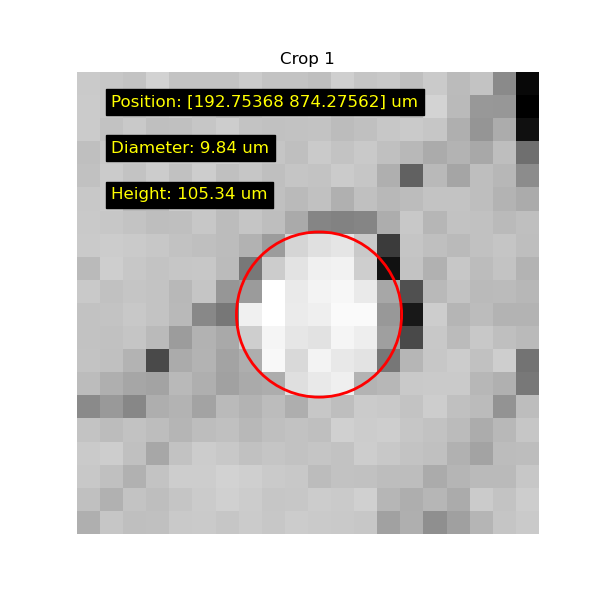

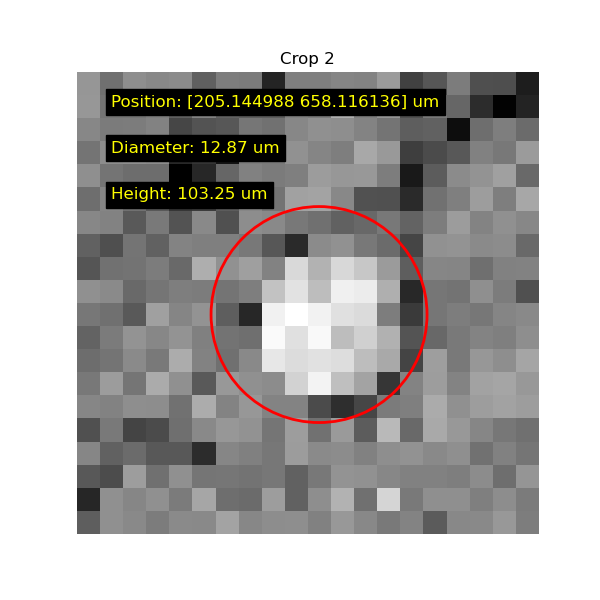

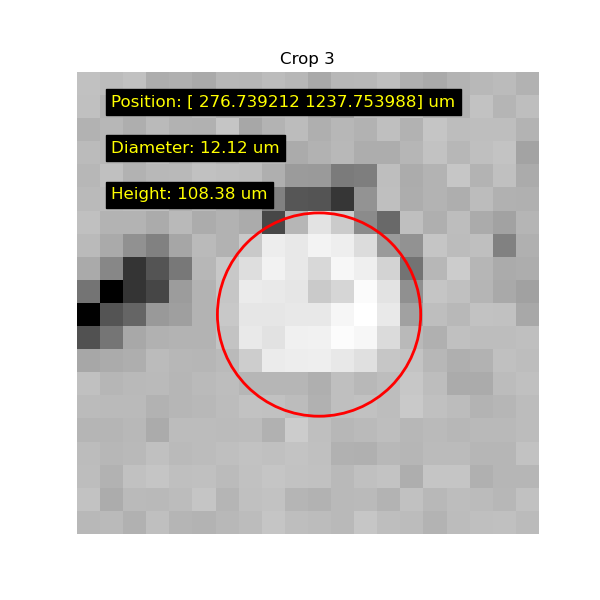

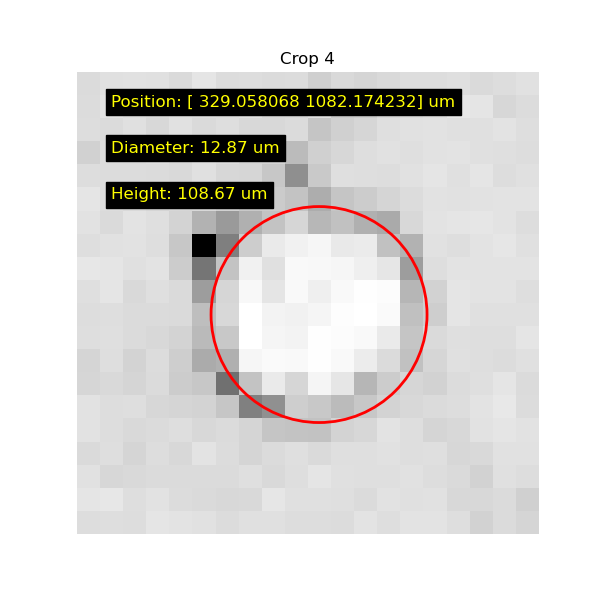

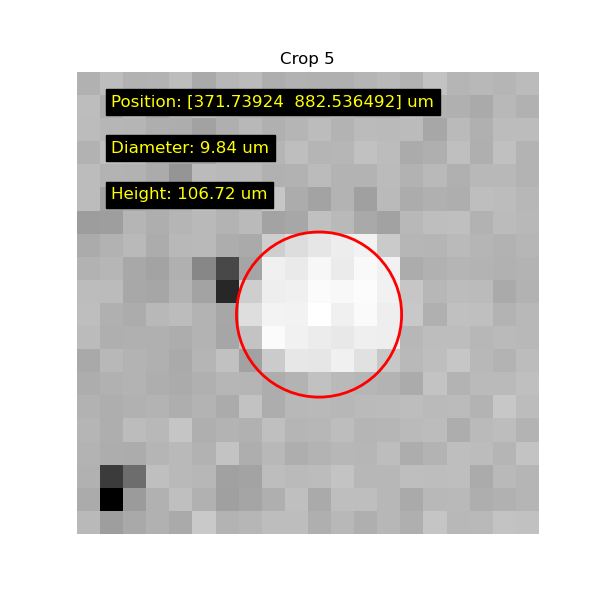

...

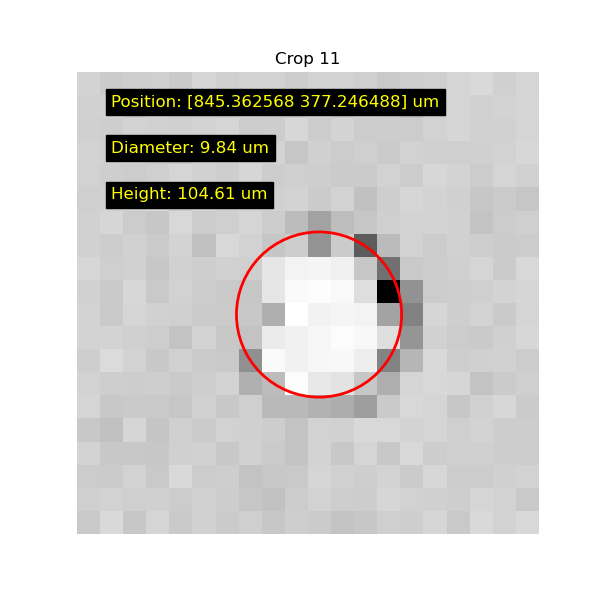

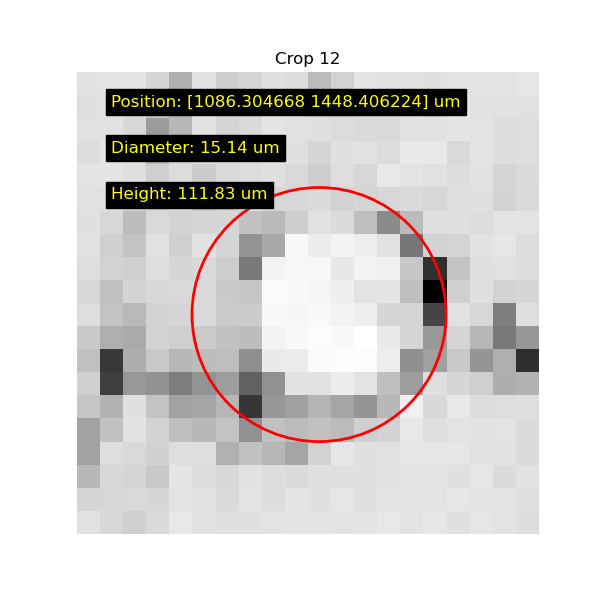

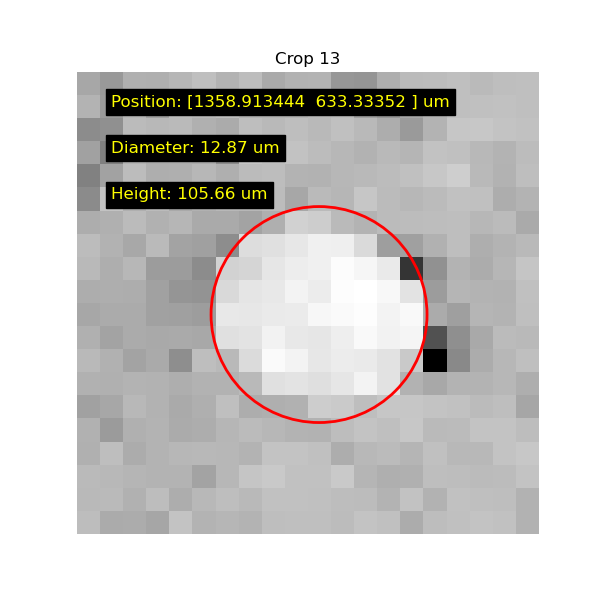

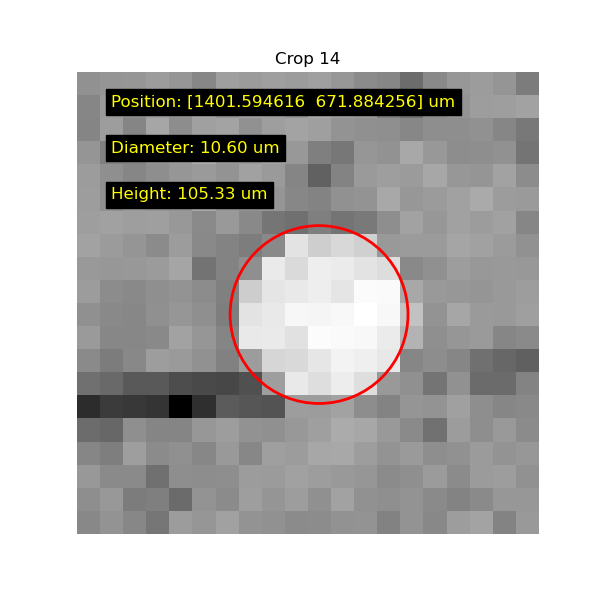

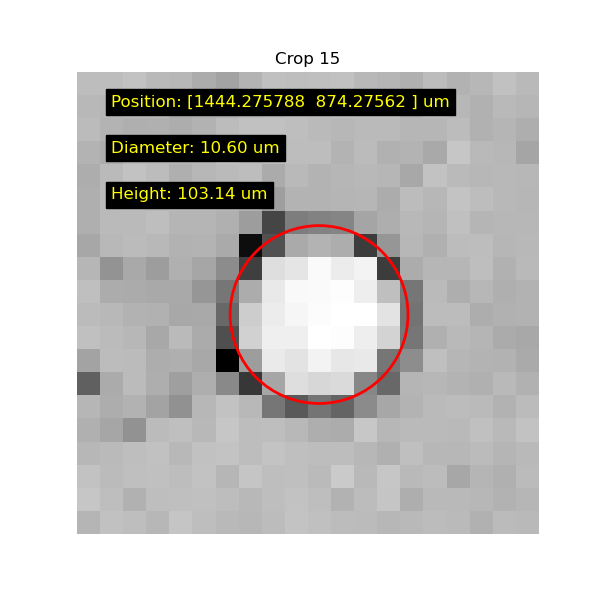

In [17]:
# note: d is radius, not diameter
os.makedirs(save_path + f'puck_{labeler}_final_crops', exist_ok=True)
final_crops = []
final_diameters = []
final_heights = []
final_positions = []
spot_number = 0
spot_ids = []
for i, (crop, r, height) in enumerate(zip(filtered_crops, min_dervs, filtered_heights)):    
    # Plot the circle representing the diameter (if it exists)
    h, w = crop.shape
    # if d is between 6 and 12
    if r*2 > 6 and r*2 < 12:
        spot_number += 1
        spot_ids.append(spot_number)
        final_crops.append(crop)
        final_diameters.append(2*fudge_factor*r*x_scale)
        final_heights.append(height)
        final_positions.append(filtered_positions_pix[i]*x_scale)

        plt.figure(figsize=(6, 6))
        plt.imshow(crop, cmap='gray')
        circle = plt.Circle((w / 2, h / 2), r*fudge_factor, color='red', fill=False, linewidth=2)
        plt.gca().add_patch(circle)

        # Add text for the diameter and height
        plt.text(1, 1, f'Position: {filtered_positions_pix[i]*x_scale} um', color='yellow', fontsize=12, backgroundcolor='black')
        plt.text(1, 3, f'Diameter: {2*fudge_factor*r*x_scale:.2f} um', color='yellow', fontsize=12, backgroundcolor='black')
        plt.text(1, 5, f'Height: {height:.2f} um', color='yellow', fontsize=12, backgroundcolor='black')
        
        plt.axis('off')
        plt.title(f'Crop {spot_number}')
        plt.show()

        plt.savefig(save_path + f'puck_{labeler}_final_crops/crop_{spot_number}.png')
        

In [18]:
# Create a DataFrame from the lists
data = {
    'Spot ID': spot_ids,
    'Diameter (um)': final_diameters,
    'Height (um)': final_heights,
    'Position (um)': final_positions
}
df = pd.DataFrame(data)
# Save DataFrame to CSV
df.to_csv(save_path + f'puck_{labeler}_fiber_data.csv', index=False)

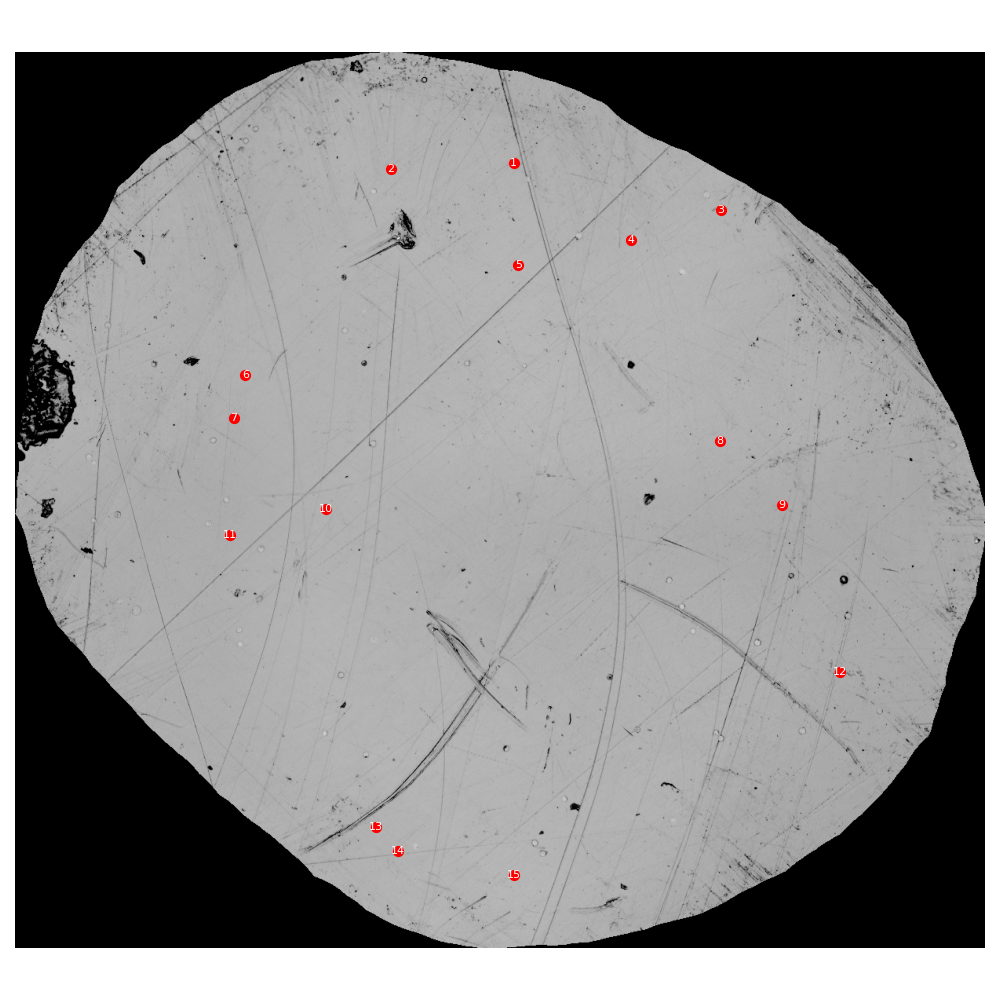

KeyError: 'buttons'

KeyError: 'buttons'

KeyError: 'buttons'

KeyError: 'buttons'

In [19]:
final_positions = np.array(final_positions)
final_positions = final_positions // x_scale

# Visualize
fig, ax = plt.subplots(1, 1, figsize=(10,10), sharex=True, sharey=True)
ax.imshow(roi, cmap='gray')

for pos, idx in zip(final_positions, spot_ids):
    ax.scatter(pos[1], pos[0], c='red', s=50, label='Spots')
    ax.text(pos[1], pos[0], str(idx), color='white', fontsize=8, ha='center', va='center')
    ax.axis('off')
fig.tight_layout()
plt.savefig(save_path + f'puck_{labeler}_fiber_positions.png')

# save the raw image for later as well:
np.savez(save_path + f'puck_{labeler}_raw_image.npz', raw_image = roi)